# Unified Figure 1: real time series and PSD

This notebook makes the paper's Figure 1: the four source records (ERB22, ALLEY00,
VIEIRA11, WU18) as time series next to their power spectral density (PSD). It also
builds an extended version covering every supplemental record and treatment, which
becomes Fig. S5. Figure 1's job, before any CCM machinery shows up, is to answer two
questions: (1) what do the four raw records actually look like next to each other,
and (2) which periodicities in each record clear red-noise (AR1) significance,
specifically whether the canonical solar cycles (Gleissberg ~90 yr, de Vries ~208 yr,
Hallstatt ~2400 yr) show up in the TSI reconstructions and, if so, whether the
temperature targets share them. That spectral overlap (or lack of it) feeds directly
into the Introduction's argument that "similar periodicities" are suggestive but not
enough on their own to prove a causal link, which is exactly why the paper turns to
CCM.


In [11]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

from cedarkit.utils.routing.paths import *
from cedarkit.core.data_var import VarObject
from cedarkit.core.project_config import load_config
from cedarkit.utils.plotting import save_figure

import warnings

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
# Keep the existing notebook-relative project discovery, but allow filtered projects
# to live under CCM_software/hol_temp_tsi_ccm1k.
stem = Path(*(p := Path.cwd().resolve()).parts[: p.parts.index("notebooks")])
print(stem)
proj_dir = stem/'hol_temp_tsi_ccm'

figures_dir = stem / "figures" / "Fig1__real_ts_psd_unified"
figures_dir.mkdir(exist_ok=True, parents=True)

/Users/jlanders/PycharmProjects/CCM_software/hol_temp_tsi_ccm_pb


## Read in all treatment versions

In [13]:
# These aliases join legacy raw IDs to the corresponding filtered IDs. They are
# source identity, not plot layout; rows use the normalized right-hand keys.
source_key_aliases = {
    "gisp2alley00tanom": "alley00gisp2multiproxy",
    "gisp2doering22t15n": "doering22gisp2t15n",
    "gisp2martin24tanom": "martin24gisp2tanom",
    "ngripmartin24tanom": "martin24ngriptanom",
    "gisp2seierstad14d18o": "seierstad14gisp2d18o",
    "ngrip1seierstad14d18o": "seierstad14ngrip1d18o",
    "wu18tsi": "wu18tsianom",
    "vieira11tsi": "vieira11tsianom",
}


def source_key(var_id):
    """Return the source-family key shared by raw, linear, and 1 kyr versions."""
    key = re.sub(r"[^a-z0-9]", "", str(var_id).lower())
    for token in ("1kyrfir", "linear"):
        key = key.replace(token, "")
    return source_key_aliases.get(key, key)

## Load in

In [14]:
# Flat, hardcoded list of every variable needed across all three treatments (not read via proj_config.yaml).
# (1) Flat list of var_ids -- one entry per unique variable across all treatments.
var_ids = [
    # Raw
    "Erb22daGMST", "Wu18TSI", "Vieira11TSI",
    "GISP2Alley00Tanom", "Tian22HT115kaALLGMST", "GISP2Doering22T15N",
    "GISP2Martin24Tanom", "NGRIPMartin24Tanom", "GISP2Seierstad14d18O", "NGRIP1Seierstad14d18O",
    # 1 kyr FIR high-pass
    "erb22dagmst1kyrfir", "wu18tsianom1kyrfir", "vieira11tsianom1kyrfir",
    "alley00gisp2multiproxy1kyrfir", "tian22ht115kaallgmst1kyrfir", "doering22gisp2t15n1kyrfir",
    "martin24gisp2tanom1kyrfir", "martin24ngriptanom1kyrfir", "seierstad14gisp2d18o1kyrfir", "seierstad14ngrip1d18o1kyrfir",
    # Precomputed linearly detrended
    "Erb22daGMSTLinear", "Wu18TSILinear", "Vieira11TSILinear",
    "GISP2Alley00TanomLinear", "Tian22HT115kaALLGMSTLinear", "GISP2Doering22T15NLinear",
    "GISP2Martin24TanomLinear", "NGRIPMartin24TanomLinear", "GISP2Seierstad14d18OLinear", "NGRIP1Seierstad14d18OLinear",
]

# (2) var_obj_d built directly from var_ids in a single loop -- no proj_config.yaml, no dyad
# directories. The two TSI series (Wu18/Vieira11, in any raw/1kyrfir/Linear variant) are the
# only targets; everything else is col.
var_obj_d = {}
series_versions = {}
for var_id in var_ids:
    print(var_id)
    var_type = "target" if 'tsi' in var_id.lower() else "coll"# ("wu18" in var_id.lower() or "vieira11" in var_id.lower()) else "col"
    treatment = "1kyr" if "1kyrfir" in var_id.lower() else "linearlydetrended" if "linear" in var_id.lower() else "raw"
    source_family = source_key(var_id)
    existing = series_versions.setdefault(source_family, {}).get(treatment)
    if existing is not None and existing != var_id:
        raise ValueError(f"Ambiguous {treatment} series for {source_family!r}: {existing!r} and {var_id!r}")
    series_versions[source_family][treatment] = var_id
    new_var_obj = VarObject(None, var_id, proj_dir)
    new_var_obj.using_master_config=True
    new_var_obj.get_real()
    stdevs = [new_var_obj.ts[new_var_obj.col_name].iloc[n : n + 200].std() for n in np.arange(0, len(new_var_obj.ts), 100) if n + 200 <= len(new_var_obj.ts)]
    new_var_obj.std = np.mean(stdevs)
    new_var_obj.mean = new_var_obj.ts[new_var_obj.col_name].mean()
    new_var_obj.var_type = var_type
    new_var_obj.source_key = source_family
    new_var_obj.treatment = treatment
    var_obj_d[var_id] = new_var_obj

print(f"Loaded {len(var_obj_d)} variables: {sum(v.var_type == 'target' for v in var_obj_d.values())} target, {sum(v.var_type == 'col' for v in var_obj_d.values())} col.")


Erb22daGMST
Wu18TSI
Vieira11TSI
GISP2Alley00Tanom
Tian22HT115kaALLGMST
GISP2Doering22T15N
GISP2Martin24Tanom
NGRIPMartin24Tanom
GISP2Seierstad14d18O
NGRIP1Seierstad14d18O
erb22dagmst1kyrfir
wu18tsianom1kyrfir
vieira11tsianom1kyrfir
alley00gisp2multiproxy1kyrfir
tian22ht115kaallgmst1kyrfir
doering22gisp2t15n1kyrfir
martin24gisp2tanom1kyrfir
martin24ngriptanom1kyrfir
seierstad14gisp2d18o1kyrfir
seierstad14ngrip1d18o1kyrfir
Erb22daGMSTLinear
Wu18TSILinear
Vieira11TSILinear
GISP2Alley00TanomLinear
Tian22HT115kaALLGMSTLinear
GISP2Doering22T15NLinear
GISP2Martin24TanomLinear
NGRIPMartin24TanomLinear
GISP2Seierstad14d18OLinear
NGRIP1Seierstad14d18OLinear
Loaded 30 variables: 6 target, 0 col.


## Figure configuration

The extended figure lines up three treatments of each record side by side: raw,
linearly detrended, and 1-kyr high-pass filtered, the same three treatments that
carry through the CCM parameter sweep (see [Detrending & High-Pass Filtering (Figure S5)](2_setup__detrend_highpass_1kyr.ipynb) and
Text S2.2). Seeing them together shows directly what each treatment strips out (a
linear trend vs. everything below 1 kyr) before those same treated series turn up
again as separate rows in the later multi-dyad result grids (Figs. S6, S7, S9).

In [15]:

palette_var_groups = {
    "GMST": ["tian22ht115kaallgmst", "erb22dagmst"],
    "temp": ["alley00gisp2multiproxy", "doering22gisp2t15n", "martin24gisp2tanom", "martin24ngriptanom"],
    "d18O": ["seierstad14gisp2d18o", "seierstad14ngrip1d18o"],
    "TSI": ["wu18tsianom", "vieira11tsianom"],
}

group_palette_triples = {
    "GMST": {"raw": "xkcd:orange", "linearlydetrended": "xkcd:raspberry", "1kyr": "xkcd:plum"},
    "temp": {"raw": "xkcd:navy blue", "linearlydetrended": "xkcd:cornflower blue", "1kyr": "xkcd:sea blue"},
    "d18O": {"raw": "xkcd:twilight blue", "linearlydetrended": "xkcd:dark teal", "1kyr": "xkcd:jungle green"},
    "TSI": {"raw": "xkcd:orangeish", "linearlydetrended": "xkcd:goldenrod", "1kyr": "xkcd:dark maroon"},
}

reference_plot_style = {
    "font.size": 18,
    "axes.titlesize": 16,
    "axes.labelsize": 22,
    "xtick.labelsize": 20,
    "ytick.labelsize": 20,
    "legend.fontsize": 26,
    "figure.titlesize": 18,
    "figure.dpi": 300,
    "savefig.dpi": 300,
}


## Palette resolution

In [16]:
# Compact figure uses each variable's own color; extended figure can override by source theme + treatment.
def build_palette(var_obj_d, palette_var_groups=None, group_palette_triples=None):
    """Return actual variable IDs mapped to display colors.

    Without both optional theme inputs, this preserves the compact notebook's
    direct `VarObject.color` palette. With both, it applies the mega notebook's
    source-theme/treatment overrides.
    """
    palette = {var_id: var_obj.color for var_id, var_obj in var_obj_d.items()}
    if palette_var_groups is None or group_palette_triples is None:
        return palette

    source_to_group = {}
    for group_name, source_keys in palette_var_groups.items():
        for source_key in source_keys:
            if source_key in source_to_group:
                raise ValueError(f"Source {source_key!r} belongs to both " f"{source_to_group[source_key]!r} and {group_name!r}.")
            source_to_group[source_key] = group_name

    for var_id, dataset in var_obj_d.items():
        group_name = source_to_group.get(dataset.source_key)
        if group_name is None:
            continue
        treatment_colors = group_palette_triples.get(group_name)
        if treatment_colors is None:
            continue
        color = treatment_colors.get(dataset.treatment)
        if color is not None:
            palette[var_id] = color
    return palette


## Resolve time-series panels into logical y-axis groups

In [17]:
# Groups variables into primary_y/secondary_y axis groups by whether their scales are close enough to share an axis.
PANEL_TREATMENT = {"raw_ts": "raw", "highpass_ts": "1kyr", "lineardetrended_ts": "linearlydetrended"}


def build_axis_scales(var_ids, var_obj_d):
    """Copied from the mega notebook: calculate robust scale measures per series."""
    scales = {}
    for var_id in var_ids:
        dataset = var_obj_d[var_id]
        series = dataset.ts[dataset.col_name].to_numpy(dtype=float)
        finite = series[np.isfinite(series)]
        if finite.size == 0:
            std_value = float(getattr(var_obj_d[var_id], "std", np.nan))
            range_value = np.nan
        else:
            std_value = float(np.nanstd(finite))
            range_value = float(np.nanmax(finite) - np.nanmin(finite))

        if not np.isfinite(std_value) or std_value <= 0:
            std_value = float(getattr(var_obj_d[var_id], "std", 0.0) or 0.0)
        if not np.isfinite(range_value) or range_value <= 0:
            range_value = std_value

        scales[var_id] = {"std": max(std_value, 1e-12), "range": max(range_value, 1e-12)}
    return scales


def group_by_std_or_range(var_ids, var_obj_d, threshold=1):
    """Group series whose standard deviation and range are within an order of magnitude."""
    if not var_ids:
        return []

    scales = build_axis_scales(var_ids, var_obj_d)
    ranked = sorted(var_ids, key=lambda var_id: max(np.log10(scales[var_id]["std"]), np.log10(scales[var_id]["range"])))

    groups = [[ranked[0]]]
    current_min_std = np.log10(scales[ranked[0]]["std"])
    current_min_range = np.log10(scales[ranked[0]]["range"])

    for var_id in ranked[1:]:
        log_std = np.log10(scales[var_id]["std"])
        log_range = np.log10(scales[var_id]["range"])
        split = (log_std - current_min_std) > threshold or (log_range - current_min_range) > threshold or (log_range - current_min_std) > threshold or (log_std - current_min_range) > threshold
        if split:
            groups.append([var_id])
            current_min_std = log_std
            current_min_range = log_range
        else:
            groups[-1].append(var_id)
            current_min_std = min(current_min_std, log_std)
            current_min_range = min(current_min_range, log_range)

    return groups


def resolve_y_axis_groups(source_keys, panel_design, series_versions, var_obj_d, threshold=1):
    """Return logical primary/secondary y groups for one row in one TS panel."""
    try:
        treatments = [PANEL_TREATMENT[token] for token in panel_design]
    except KeyError as err:
        raise ValueError(f"Unsupported time-series panel design: {panel_design}") from err
    if len(treatments) != len(set(treatments)):
        raise ValueError(f"Repeated treatment in panel design: {panel_design}")
    var_ids = [
        series_versions[source_key][treatment]
        for source_key in source_keys
        for treatment in treatments
    ]
    axis_groups = group_by_std_or_range(var_ids, var_obj_d, threshold=threshold)
    if len(axis_groups) > 2:
        raise ValueError(f"{panel_design} for {source_keys} needs {len(axis_groups)} y-axis groups; " "the figure supports primary_y plus one secondary_y.")
    return {"panel_var_ids": var_ids, "primary_y": axis_groups[0] if axis_groups else [], "secondary_y": axis_groups[1] if len(axis_groups) == 2 else []}


In [18]:
def axis_label_identity(var_ids, var_obj_d):
    """Variable/unit identity used to decide whether a secondary label adds information."""
    return {(clean_treatment(getattr(var_obj_d[var_id], "var_name", var_id)), str(getattr(var_obj_d[var_id], "unit", "") or "").strip()) for var_id in var_ids}


def needs_secondary_y_label(y_axis_groups, var_obj_d):
    secondary_ids = y_axis_groups.get("secondary_y", [])
    if not secondary_ids:
        return False
    return axis_label_identity(y_axis_groups["primary_y"], var_obj_d) != axis_label_identity(secondary_ids, var_obj_d)

## Draw one time-series panel

In [19]:
def custom_formatter(value, position):
    fixed = ("%f" % value).rstrip("0").rstrip(".")
    return fixed.replace("0.", ".")


def clean_treatment(text):
    if text is None:
        return ""
    cleaned = str(text)
    for token in ["(1kyr FIR high-pass)", "(1kyr h-pf)", "(linear detrended)", "(linearly detrended)", "1kyr FIR high-pass", "1kyr high-pass", "high-pass", "linearly detrended", "linear detrended"]:
        cleaned = cleaned.replace(token, "")
    cleaned = cleaned.replace("()", "")
    while "  " in cleaned:
        cleaned = cleaned.replace("  ", " ")
    return cleaned.strip(" ,;:-")


def get_author_year(dataset, fallback):
    author = str(getattr(dataset, "author", "") or "")
    year = str(getattr(dataset, "year", "") or "")
    author = author.replace("et al.", "").replace("et al", "").replace(".", "").strip()
    if "," in author:
        author = author.split(",")[0].strip()
    if len(author.split()) > 0:
        author = author.split()[0]
    author = author.replace(" ", "")
    year = "".join(character for character in year if character.isdigit())
    author_has_letters = any(character.isalpha() for character in author)

    if not (author_has_letters and len(year) >= 4):
        var_label = clean_treatment(getattr(dataset, "var_label", fallback))
        var_label_clean = var_label.replace("et al.", "").replace("et al", "").replace(".", " ").strip()
        label_head = var_label_clean.split(",")[0].strip()
        if ";" in label_head:
            label_head = label_head.split(";")[-1].strip()
        tokens = [token for token in label_head.replace("/", " ").split() if any(character.isalpha() for character in token)]
        skip_tokens = {"gisp2", "ngrip", "cesm", "all", "data", "assimilation", "reconstruction"}
        var_author = ""
        for token in tokens:
            token_alpha = "".join(character for character in token if character.isalpha())
            if len(token_alpha) == 0:
                continue
            if token_alpha.lower() in skip_tokens:
                continue
            var_author = token_alpha
            break
        var_year = ""
        for index in range(max(0, len(var_label) - 3)):
            chunk = var_label[index : index + 4]
            if chunk.isdigit() and 1000 <= int(chunk) <= 2999:
                var_year = chunk
                break
        if not author_has_letters and len(var_author) > 0:
            author = var_author
            author_has_letters = True
        if len(year) < 4 and len(var_year) == 4:
            year = var_year

    label = f"{author}{year}".strip()
    if author_has_letters and len(year) >= 4:
        return label
    return clean_treatment(getattr(dataset, "var_label", fallback))


def clean_source(dataset):
    source_raw = str(getattr(dataset, "source", "") or "")
    source_norm = source_raw.strip().lower()
    if source_norm.startswith("gisp2"):
        return "GISP2"
    if source_norm.startswith("ngrip"):
        return "NGRIP"
    if source_norm in {"da", "dataassimilation"}:
        return "Data Assimilation"
    if source_norm in {"model", "recon", "reconstruction"}:
        return "Reconstruction"
    if source_norm in {"ht115kaall", "cesmall", "cesm"}:
        return "CESM (ALL)"
    return source_raw.strip()


def format_y_label(y_axis_groups, var_obj_d, var_ids=None, include_source=True):
    panel_var_ids = y_axis_groups["panel_var_ids"] if var_ids is None else var_ids
    raw_ids = [var_id for var_id in panel_var_ids if var_obj_d[var_id].treatment == "raw"]
    var_id = raw_ids[0] if raw_ids else panel_var_ids[0]
    dataset = var_obj_d[var_id]
    var_name = clean_treatment(getattr(dataset, "var_name", var_id))
    unit = str(getattr(dataset, "unit", "") or "").strip()
    display_var_name = var_name.replace("d18O", r"$\delta^{18}O$").replace("δ18O", r"$\delta^{18}O$")
    if unit in {"C", "°C", "degC"}:
        display_unit = r"$^\circ$C"
    elif unit:
        display_unit = f"${unit}$"
    else:
        display_unit = ""
    variable_line = f"{display_var_name} ({display_unit})" if display_unit else display_var_name
    # Multiple raw sources are identified by the legend; repeating provenance here is misleading.
    if not include_source or len(raw_ids) > 1:
        return "\n".join(line for line in [display_var_name, display_unit] if line)
    return "\n".join(line for line in [get_author_year(dataset, var_id), clean_source(dataset), variable_line] if str(line).strip())


def _set_y_axis_side(axis, side):
    if side not in {"left", "right"}:
        raise ValueError(f"Y-axis side must be 'left' or 'right', got {side!r}")
    other_side = "right" if side == "left" else "left"
    axis.yaxis.set_label_position(side)
    axis.yaxis.tick_left() if side == "left" else axis.yaxis.tick_right()
    axis.spines[side].set_visible(True)
    axis.spines[other_side].set_visible(False)
    return other_side


def draw_time_series_panel(
    primary_ax,
    y_axis_groups,
    panel_design,
    var_obj_d,
    palette,
    axis_sides=None,
    *,
    time_var="time",
    alpha=0.8,
    linewidth=2,
    time_limits=None,
    include_source_labels=True,
    show_primary_label=True,
    show_secondary_label=True,
):
    """Draw one TS subplot and return its axes, legend handles, and time direction.

    `primary_y` and `secondary_y` are logical groups. Their physical left/right
    placement is supplied by `axis_sides`, so figure layout remains responsible
    for subplot-specific positioning.
    """
    if panel_design == ["psd"]:
        raise ValueError("draw_time_series_panel accepts time-series panels, not ['psd']")

    axis_sides = axis_sides or {"primary_y": "left", "secondary_y": "right"}
    primary_ids = y_axis_groups.get("primary_y", [])
    secondary_ids = y_axis_groups.get("secondary_y", [])
    if not primary_ids:
        raise ValueError("A time-series panel needs a non-empty primary_y group")

    groups = [("primary_y", primary_ids, primary_ax)]
    if secondary_ids:
        groups.append(("secondary_y", secondary_ids, primary_ax.twinx()))

    panel_axes = {}
    handles = []
    labels = []
    time_unit = "years BP"

    for role, var_ids, axis in groups:
        side = axis_sides[role]
        other_side = _set_y_axis_side(axis, side)
        current_dataset = var_obj_d[var_ids[0]]
        # Draw the first declared source last, preserving the compact reference layering.
        for var_id in reversed(var_ids):
            dataset = var_obj_d[var_id]
            axis.plot(
                dataset.ts[time_var],
                dataset.ts[dataset.col_name] - dataset.mean,
                color=palette[var_id],
                alpha=alpha,
                linewidth=linewidth,
                zorder=-10,
                label=var_id,
                rasterized=True,
            )

        if time_limits is not None:
            axis.set_xlim(time_limits)

        # Preserve the reference notebooks' direction-aware time label behavior.
        if axis.get_xlim()[0] < axis.get_xlim()[1]:
            if "bp" not in time_unit.lower():
                time_unit = f"{time_unit} BP"
        elif "bp" in time_unit.lower():
            time_unit = time_unit.replace(" BP", "")

        if role == "primary_y" and show_primary_label:
            axis.set_ylabel(format_y_label(y_axis_groups, var_obj_d, include_source=include_source_labels), labelpad=10)
        elif role == "primary_y":
            axis.set_ylabel("")
        elif show_secondary_label and needs_secondary_y_label(y_axis_groups, var_obj_d):
            axis.set_ylabel(format_y_label(y_axis_groups, var_obj_d, var_ids=var_ids, include_source=include_source_labels), rotation=270 if side == "right" else 90, labelpad=45)
        else:
            axis.set_ylabel("")

        # Preserve current Matplotlib-tick-derived limits and y-spine styling.
        y_ticks = axis.get_yticks()
        amplitude = max(np.abs(y_ticks[0]), np.abs(y_ticks[-1]))
        axis.set_ylim(-amplitude, amplitude)
        y_ticks = axis.get_yticks()
        axis.spines[side].set_bounds([y_ticks[1], y_ticks[-2]])
        axis.set_yticks(y_ticks[1:-1])
        axis.yaxis.set_major_formatter(FuncFormatter(custom_formatter))

        if len(var_ids) > 1:
            axis.spines[side].set_color("k")
            axis.tick_params(axis="y", colors="k")
        else:
            color = palette[current_dataset.var_id]
            axis.spines[side].set_color(color)
            axis.tick_params(axis="y", colors=color)

        axis.spines[other_side].set_visible(False)
        axis.spines[side].set_position(("outward", -5))
        axis.grid(False)

        group_handles, group_labels = axis.get_legend_handles_labels()
        handles_by_label = dict(zip(group_labels, group_handles))
        # Legend order remains the declared source order, independently of draw order.
        handles.extend(handles_by_label[var_id] for var_id in var_ids if var_id in handles_by_label)
        labels.extend(var_id for var_id in var_ids if var_id in handles_by_label)
        legend = axis.get_legend()
        if legend is not None:
            legend.remove()
        panel_axes[role] = axis

    return {"axes": panel_axes, "handles": handles, "labels": labels, "time_unit": time_unit}

## Time-axis styling by row

In [20]:
# Styles each panel's x-axis (spines, ticks, label position) by its row position: top, middle, or bottom.
def style_axes_by_row(ax, loc_code_v, bounds=None):
    """
    Adjusts axis appearance depending on the subplot's row position.

    Parameters
    ----------
    ax : matplotlib.axes.Axes
        The axes to style.
    row_index : int
        Zero-based index of the row this subplot is in.
    total_rows : int
        Total number of rows in the subplot grid.
    """
    # First reset to a clean state
    ax.spines["top"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.tick_params(axis="x", bottom=False, top=False, labelbottom=False, labeltop=False)
    xlabel = ax.get_xlabel()
    ax.set_xlabel("")

    ax.tick_params(axis="x", direction="out", length=4, width=1)

    if loc_code_v == "T":
        # Top row: top spine and labels at top
        ax.spines["top"].set_visible(True)
        ax.tick_params(axis="x", bottom=False, top=True, labelbottom=False, labeltop=True)
        ax.xaxis.set_label_position("top")
        if bounds is not None:
            ax.spines["top"].set_bounds(bounds)
        ax.set_xlabel(xlabel)  # keep any xlabel text you already set
    elif loc_code_v == "B":  # - 1:
        # Bottom row: bottom spine and labels at bottom
        ax.spines["bottom"].set_visible(True)
        ax.tick_params(axis="x", bottom=True, top=False, labelbottom=True, labeltop=False)
        ax.xaxis.set_label_position("bottom")
        if bounds is not None:
            ax.spines["bottom"].set_bounds(bounds)
        ax.set_xlabel(xlabel)
    else:
        # Middle rows: no x-axis spines or labels
        if bounds is not None:
            ax.spines["top"].set_bounds(bounds)
        ax.spines["top"].set_visible(False)
        ax.spines["bottom"].set_visible(False)
        ax.tick_params(axis="x", bottom=False, top=False, labelbottom=False, labeltop=False)
        ax.set_xlabel("")

## Shared figure layout

In [21]:
# prepare_figure_layout resolves rows/slots into GridSpec metadata; create_figure_grid (below) allocates the axes.
def prepare_figure_layout(row_design, row_groups, series_versions, var_obj_d, layout):
    """Resolve data rows and translate slots/groups into GridSpec row metadata."""
    data_rows = []
    grid_rows = []
    legend_markers = []  # retained as empty compatibility metadata.

    for group_index, group in enumerate(row_groups):
        for item in group:
            if "slot" in item:
                slot_items = item["slot"]
                slot_items = [slot_items] if isinstance(slot_items, str) else list(slot_items)
                if "spectral_blocks" in slot_items:
                    before, slot_height, after = layout["slot_ratios"]
                    grid_rows.extend(
                        [
                            {"kind": "slot_buffer", "height_ratio": before},
                            {"kind": "slot", "items": slot_items, "height_ratio": slot_height, "group_index": group_index},
                            {"kind": "slot_buffer", "height_ratio": after},
                        ]
                    )
                elif slot_items == ["legend"]:
                    before, slot_height, after = layout.get("legend_slot_ratios", layout["slot_ratios"])
                    grid_rows.extend(
                        [
                            {"kind": "slot_buffer", "height_ratio": before},
                            {"kind": "slot", "items": slot_items, "height_ratio": slot_height, "group_index": group_index},
                            {"kind": "slot_buffer", "height_ratio": after},
                        ]
                    )
                elif slot_items == ["spacer"]:
                    grid_rows.append({"kind": "explicit_spacer", "height_ratio": layout["group_spacer_ratio"]})
                else:
                    raise ValueError(f"Unsupported slot contents: {slot_items}")
                continue

            if len(item) != 1:
                raise ValueError(f"Each data row must contain one letter: {item}")
            letter, source_keys = next(iter(item.items()))
            panel_groups = {
                panel_index: resolve_y_axis_groups(source_keys, panel_design, series_versions, var_obj_d)
                for panel_index, panel_design in enumerate(row_design)
                if panel_design != ["psd"]
            }
            data_row_index = len(data_rows)
            data_rows.append({"letter": letter, "source_keys": source_keys, "group_index": group_index, "panel_groups": panel_groups})
            grid_rows.append({"kind": "data", "data_row_index": data_row_index, "height_ratio": layout["data_row_ratio"]})

        if group_index < len(row_groups) - 1:
            grid_rows.append({"kind": "group_spacer", "height_ratio": layout["group_spacer_ratio"]})

    if not data_rows:
        raise ValueError("Figure layout needs at least one data row.")

    for data_row_index, data_row in enumerate(data_rows):
        total_rows = len(data_rows)
        data_row["x_axis_location"] = "B" if total_rows == 1 or data_row_index == total_rows - 1 else "T" if data_row_index == 0 else "C"
        data_row["has_secondary_ylabel"] = any(needs_secondary_y_label(axis_groups, var_obj_d) for axis_groups in data_row["panel_groups"].values())

    return {"data_rows": data_rows, "grid_rows": grid_rows, "legend_markers": legend_markers, "needs_right_margin": any(row["has_secondary_ylabel"] for row in data_rows)}


def create_figure_grid(row_design, prepared_layout, layout):
    """Allocate figure axes for data panels and every declared grid slot."""
    width_ratios = [layout["ts_width_ratio"] if design != ["psd"] else layout["psd_width_ratio"] for design in row_design]
    height_ratios = [row["height_ratio"] for row in prepared_layout["grid_rows"]]
    right = layout["labeled_secondary_right"] if prepared_layout["needs_right_margin"] else layout["base_right"]
    figure = plt.figure(figsize=layout["figsize"])
    grid = GridSpec(len(height_ratios), len(row_design), figure=figure, width_ratios=width_ratios, height_ratios=height_ratios, hspace=layout["hspace"], wspace=layout["wspace"], right=right)
    panel_axes, slot_axes, slot_metadata = {}, {}, {}
    for grid_row_index, row in enumerate(prepared_layout["grid_rows"]):
        if row["kind"] == "data":
            for panel_index in range(len(row_design)):
                panel_axes[(row["data_row_index"], panel_index)] = figure.add_subplot(grid[grid_row_index, panel_index], facecolor="none")
        elif row["kind"] == "slot":
            items = set(row["items"])
            if items == {"legend"}:
                ts_indices = [index for index, design in enumerate(row_design) if design != ["psd"]]
                key = ("legend", grid_row_index)
                axis = figure.add_subplot(grid[grid_row_index, min(ts_indices) : max(ts_indices) + 1], facecolor="none")
                axis.axis("off")
                slot_axes[key], slot_metadata[key] = axis, row
            for panel_index, panel_design in enumerate(row_design):
                if "legend" in items and "spectral_blocks" in items and panel_design != ["psd"]:
                    key = ("legend", grid_row_index, panel_index)
                    axis = figure.add_subplot(grid[grid_row_index, panel_index], facecolor="none")
                    axis.axis("off")
                    slot_axes[key], slot_metadata[key] = axis, row
                if "spectral_blocks" in items and panel_design == ["psd"]:
                    axis = figure.add_subplot(grid[grid_row_index, panel_index], facecolor="none")
                    axis.set_yscale("linear")
                    axis.set_ylim([0, 1])
                    slot_axes[("spectral_blocks", panel_index)] = axis
    return {"figure": figure, "grid": grid, "panel_axes": panel_axes, "slot_axes": slot_axes, "slot_metadata": slot_metadata}


## Render all time-series panels

## PSD significance

Significance follows the paper's spectral method: estimate power spectra with the
Multi-Taper Method (MTM) and test them against an ensemble of AR(1) ("red noise")
surrogates at the 95% threshold. Periods that clear this threshold are highlighted,
and the de Vries (~208 yr), Gleissberg (~90 yr), and Hallstatt (~2400 yr) solar
cycles are marked for reference. PSD panels always use each source family's raw
treatment; detrending and high-pass filtering apply to the time-series panels, not
the spectra.

In [22]:
def calculate_psd_results(row_design, row_groups, series_versions, var_obj_d, *, n=1):
    """Compute MTM spectra and AR1 significance once for the configured figure inputs."""
    treatments = list(dict.fromkeys(
        PANEL_TREATMENT[token]
        for panel_design in row_design if panel_design != ["psd"]
        for token in panel_design
    ))
    results = {}
    for group in row_groups:
        for item in group:
            if "slot" in item:
                continue
            _, source_keys = next(iter(item.items()))
            for treatment in treatments:
                for source_key in source_keys:
                    var_id = series_versions.get(source_key, {}).get(treatment)
                    if var_id is None:
                        print(f"Missing data: source {source_key!r} has no {treatment!r} version; skipping.")
                        continue
                    if var_id not in results:
                        psd_source = var_obj_d[var_id].ps.spectral(method="mtm")
                        results[var_id] = psd_source.signif_test(number=n, method="ar1sim", qs=[0.95])
    return results


## Draw one PSD panel

In [23]:
# Significant periods are optionally sent to a declared spectral_blocks slot for annotation.
def find_streaks(indexes, delta=2):
    """Preserve the reference helper for contiguous significant spectral periods."""
    values = np.asarray(indexes).flatten()
    if values.size == 0:
        return []
    streaks = [[values[0]]]
    for value in values[1:]:
        if value - streaks[-1][-1] <= delta:
            streaks[-1].append(value)
        else:
            streaks.append([value])
    return [np.asarray(streak) for streak in streaks]


def draw_psd_panel(
    axis,
    source_keys,
    series_versions,
    var_obj_d,
    palette,
    *,
    spectral_blocks_axis=None,
    block_start_index=0,
    block_row_count=1,
    n=10,
    reference_periods=None,
    x_axis_location="B",
    psd_treatments,
    add_canonical_annotations=False,
    psd_results=None,
    show_primary_label=True,
    annotation_fontsize=16,
):
    """Draw the reference MTM/AR1 PSD treatment for one configured data row."""
    raw_ids = [series_versions[source_key]["raw"] for source_key in source_keys]
    spectral_blocks = []

    psd_series = []
    for treatment in psd_treatments:
        for source_key in source_keys:
            var_id = series_versions.get(source_key, {}).get(treatment)
            if var_id is None:
                print(f"Missing data: source {source_key!r} has no {treatment!r} PSD version; skipping.")
                continue
            psd_series.append((treatment, var_id))

    for treatment, var_id in psd_series:
        is_raw = treatment == "raw"
        dataset = var_obj_d[var_id]
        if psd_results is None:
            psd_source = dataset.ps.spectral(method="mtm")
            psd_signif = psd_source.signif_test(number=n, method="ar1sim", qs=[0.95])
        else:
            try:
                psd_signif = psd_results[var_id]
            except KeyError as err:
                raise KeyError(f"Missing precomputed PSD result for {var_id!r}") from err
        plot_kwargs = {
            "ax": axis,
            "signif_clr": palette[var_id],
            "color": palette[var_id],
            "alpha": 0.35,
            "signif_linewidth": 1,
            "signif_kwargs": {"alpha": 0.6, "color": palette[var_id]},
            "beta_kwargs": {"c": palette[var_id]},
        }
        try:
            axis = psd_signif.plot(**plot_kwargs)
        except TypeError:
            fallback_kwargs = {"ax": axis, "signif_clr": palette[var_id], "color": palette[var_id], "alpha": 0.35, "signif_linewidth": 1}
            try:
                axis = psd_signif.plot(**fallback_kwargs)
            except TypeError:
                axis = psd_signif.plot(ax=axis, color=palette[var_id], alpha=0.35)

        frequency = np.asarray(psd_signif.frequency, dtype=float)
        amplitude = np.asarray(psd_signif.amplitude, dtype=float)
        threshold = np.asarray(psd_signif.signif_qs.psd_list[0].amplitude, dtype=float)
        periods = np.divide(1, frequency, out=np.full_like(frequency, np.nan), where=frequency != 0)
        significant = amplitude >= threshold
        significant_periods = np.where(significant, periods, np.nan)
        significant_amplitude = np.where(significant, amplitude, np.nan)
        axis.plot(significant_periods, significant_amplitude, color=palette[var_id], alpha=1)

        for streak in find_streaks(np.flatnonzero(significant), delta=2):
            if len(streak) < 2:
                continue
            start, stop = streak[0], streak[-1] + 1
            interval = significant_periods[start:stop]
            interval = interval[np.isfinite(interval)]
            if interval.size == 0:
                continue
            axis.fill_between(significant_periods[start:stop], significant_amplitude[start:stop], 1e-1, color=palette[var_id], alpha=0.3, rasterized=True)
            spectral_blocks.append({"var_id": var_id, "color": palette[var_id], "interval_start": float(interval[0]), "interval_end": float(interval[-1])})
            if spectral_blocks_axis is not None and is_raw:
                lower = (block_start_index + raw_ids.index(var_id)) / block_row_count
                upper = (block_start_index + raw_ids.index(var_id) + 1) / block_row_count
                spectral_blocks_axis.fill_between(significant_periods[start:stop], lower, upper, color=palette[var_id], alpha=0.3)

    axis.set_ylabel("PSD (MTM)" if show_primary_label else "", rotation=270, labelpad=35)
    axis.yaxis.tick_right()
    axis.yaxis.set_label_position("right")
    axis.spines["left"].set_visible(False)
    axis.spines["right"].set_visible(True)
    axis.set_xlim([5500, 10])
    axis.set_xticks([20, 50, 500, 5000], minor=False)
    axis.minorticks_off()
    axis.tick_params(axis="x", which="minor", bottom=False, top=False)
    for period in [88, 208, 2400]:
        axis.axvline(period, color="k", linestyle=":", alpha=0.35)
    for period in reference_periods or []:
        axis.axvline(period, color="m", linestyle="--", alpha=0.35)
    if add_canonical_annotations:
        bbox = dict(boxstyle="round", fc="w", ec="none", alpha=0.8)
        annotations = [("de Vries\n(~208 yrs)", (209, 5e3), (101, 5200)), ("Hallstatt\n(~2400 yrs)", (2401, 1e3), (1401, 1400)), ("Gleissberg\n(~90 yrs)", (89, 1e2), (61, 150))]
        for text, xy, xytext in annotations:
            axis.annotate(
                text,
                xy=xy,
                xytext=xytext,
                ha="left",
                va="bottom",
                fontsize=annotation_fontsize,
                arrowprops={"arrowstyle": "->", "connectionstyle": "angle,angleA=0,angleB=60"},
                bbox=bbox,
                rasterized=True,
            )

    y_ticks = axis.get_yticks()
    y_limits = axis.get_ylim()
    if y_ticks.size >= 3:
        axis.set_ylim([max(y_limits[0], 0.004), y_ticks[-2]])
    y_ticks = axis.get_yticks()
    y_limits = axis.get_ylim()
    usable = y_ticks[(y_ticks >= max(y_limits[0], 1e-1)) & (y_ticks <= y_limits[1])]
    if usable.size:
        axis.spines["right"].set_bounds([usable[0], usable[-1]])
        axis.set_yticks(usable, minor=False)
    axis.spines["right"].set_position(("outward", -20))
    axis.grid(visible=False)
    axis.set_xlabel(axis.get_xlabel(), labelpad=15)
    style_axes_by_row(axis, x_axis_location, bounds=[20, 5000])

    if spectral_blocks_axis is not None:
        spectral_blocks_axis.set_xscale(axis.get_xscale())
        spectral_blocks_axis.set_xlim(axis.get_xlim())
        spectral_blocks_axis.set_xticks(axis.get_xticks())

    legend_handles, legend_labels = axis.get_legend_handles_labels()
    ar1_pairs = []
    for handle, label in zip(legend_handles, legend_labels):
        if "AR" not in label:
            continue
        wrapped_label = label.replace(", ", ",\n", 1)
        ar1_pairs.append((Line2D([], [], color="k", marker=handle.get_marker(), linestyle=handle.get_linestyle()), f"{wrapped_label}; n={n}"))
    if not ar1_pairs:
        ar1_pairs = [(Line2D([], [], color="k", linestyle="--"), f"AR(1) simulations (MoM),\n95% threshold; n={n}")]
    legend = axis.get_legend()
    if legend is not None:
        legend.remove()
    return {"axis": axis, "spectral_blocks": spectral_blocks, "ar1_pairs": ar1_pairs}

## Legends from declared slots

In [24]:
# Compact figure's legend slot gets the source-data legend; extended figure's slots get a treatment-color legend.
def add_declared_legends(figure_parts, prepared_layout, row_design, var_obj_d, palette, palette_var_groups=None, group_palette_triples=None, *, linewidth=2):
    """Fill declared legend slots; slot contents determine legend type and placement."""
    seen_labels = set()
    source_handles = []
    source_labels = []
    for handle, var_id in zip(figure_parts["handles"], figure_parts["labels"]):
        label = getattr(var_obj_d.get(var_id), "var_label", var_id)
        if label not in seen_labels:
            seen_labels.add(label)
            source_handles.append(handle)
            source_labels.append(label)

    source_group = {source: group_name for group_name, sources in (palette_var_groups or {}).items() for source in sources}
    for key, axis in figure_parts["slot_axes"].items():
        if key[0] != "legend":
            continue
        slot_row = figure_parts["slot_metadata"][key]
        if "spectral_blocks" in slot_row["items"]:
            axis.legend(source_handles, source_labels, loc="center", ncols=2, frameon=False, fontsize=int((plt.rcParams["legend.fontsize"] - 1) * 0.85))
            continue
        group_index = slot_row["group_index"]
        group_row = next(row for row in prepared_layout["data_rows"] if row["group_index"] == group_index)
        group_name = source_group[group_row["source_keys"][0]]
        colors = group_palette_triples[group_name]
        handles = [
            Line2D([], [], color=colors["raw"], linewidth=linewidth, label="untreated"),
            Line2D([], [], color=colors["linearlydetrended"], linewidth=linewidth, label="linearly detrended"),
            Line2D([], [], color=colors["1kyr"], linewidth=linewidth, label="1 kyr high-pass"),
        ]
        axis.legend(handles=handles, loc="center", ncols=3, frameon=False)


In [25]:
def add_section_dividers(figure_parts, prepared_layout, layout, row_design):
    """Reference-style centered dividers between sections without crossing a legend slot."""
    if not layout.get("show_section_dividers", False):
        return
    group_rows = {}
    for row_index, row in enumerate(prepared_layout["data_rows"]):
        group_rows.setdefault(row["group_index"], []).append(row_index)
    ordered_groups = sorted(group_rows)
    primary_axes = {row: figure_parts["panel_axes"][(row, 0)] for row in range(len(prepared_layout["data_rows"]))}
    right_axes = [axis for (_, panel_index), axis in figure_parts["panel_axes"].items() if row_design[panel_index] == ["psd"]] or list(primary_axes.values())
    x_left = min(axis.get_position().x0 for axis in primary_axes.values())
    x_right = max(axis.get_position().x1 for axis in right_axes)
    x_mid = 0.5 * (x_left + x_right)
    span = max(0.0, min(1.0, float(layout.get("divider_frac", 0.8)))) * (x_right - x_left)
    x0, x1 = x_mid - 0.5 * span, x_mid + 0.5 * span
    grid_by_data = {row["data_row_index"]: index for index, row in enumerate(prepared_layout["grid_rows"]) if row["kind"] == "data"}
    for upper_group, lower_group in zip(ordered_groups, ordered_groups[1:]):
        upper_data, lower_data = group_rows[upper_group], group_rows[lower_group]
        upper_grid, lower_grid = max(grid_by_data[row] for row in upper_data), min(grid_by_data[row] for row in lower_data)
        between = prepared_layout["grid_rows"][upper_grid + 1 : lower_grid]
        if any(row["kind"] == "slot" and "legend" in row.get("items", []) for row in between):
            continue
        y = 0.5 * (min(primary_axes[row].get_position().y0 for row in upper_data) + max(primary_axes[row].get_position().y1 for row in lower_data))
        figure_parts["figure"].add_artist(
            Line2D(
                [x0, x1],
                [y, y],
                transform=figure_parts["figure"].transFigure,
                color=layout.get("divider_color", "#d0d0d0"),
                linewidth=layout.get("divider_lw", 1.0),
                alpha=layout.get("divider_alpha", 0.7),
                solid_capstyle="round",
            )
        )

In [26]:
def render_figure(
    row_design,
    prepared_layout,
    layout,
    var_obj_d,
    palette,
    *,
    time_var="time",
    alpha=0.8,
    linewidth=2,
    palette_var_groups=None,
    group_palette_triples=None,
    n=10,
    reference_periods=None,
    psd_results=None,
):
    """Draw configured panels in display order, resolving all y-label visibility together."""
    figure_parts = create_figure_grid(row_design, prepared_layout, layout)
    ts_axes, ts_axis_locations, handles, labels = [], [], [], []
    spectral_blocks, psd_legend_handles, label_plans = [], [], []
    spectral_block_row_count = sum(len(row["source_keys"]) for row in prepared_layout["data_rows"])
    spectral_block_cursor = 0
    psd_treatments = list(dict.fromkeys(
        PANEL_TREATMENT[token]
        for panel_design in row_design if panel_design != ["psd"]
        for token in panel_design
    ))

    final_index = len(row_design) - 1
    for data_row_index, data_row in enumerate(prepared_layout["data_rows"]):
        previous_ylabel = None
        for panel_index, panel_design in enumerate(row_design):
            is_ts = panel_design != ["psd"]
            primary_side = "left" if panel_index < final_index else "right"
            secondary_label = None

            if is_ts:
                y_axis_groups = data_row["panel_groups"][panel_index]
                primary_label = format_y_label(y_axis_groups, var_obj_d, var_ids=y_axis_groups["primary_y"], include_source=layout.get("include_source_labels", True))
                if needs_secondary_y_label(y_axis_groups, var_obj_d):
                    secondary_label = format_y_label(y_axis_groups, var_obj_d, var_ids=y_axis_groups["secondary_y"], include_source=layout.get("include_source_labels", True))
            else:
                primary_label = "PSD (MTM)"

            # The outer right primary axis is always exposed; all other decisions
            # compare against the last y label actually shown in this row.
            primary_is_outer_edge = primary_side == "right" and panel_index == len(row_design) - 1
            show_primary_label = primary_is_outer_edge or primary_label != previous_ylabel
            label_after_primary = primary_label if show_primary_label else previous_ylabel
            show_secondary_label = secondary_label is not None and secondary_label != label_after_primary
            previous_ylabel = secondary_label if show_secondary_label else label_after_primary
            label_plans.append(
                {
                    "data_row_index": data_row_index,
                    "panel_index": panel_index,
                    "primary_label": primary_label,
                    "secondary_label": secondary_label,
                    "show_primary_label": show_primary_label,
                    "show_secondary_label": show_secondary_label,
                }
            )

            if is_ts:
                result = draw_time_series_panel(
                    figure_parts["panel_axes"][(data_row_index, panel_index)],
                    y_axis_groups,
                    panel_design,
                    var_obj_d,
                    palette,
                    axis_sides={"primary_y": "left", "secondary_y": "right"},
                    time_var=time_var,
                    alpha=alpha,
                    linewidth=linewidth,
                    time_limits=layout.get("time_limits"),
                    include_source_labels=layout.get("include_source_labels", True),
                    show_primary_label=show_primary_label,
                    show_secondary_label=show_secondary_label,
                )
                for axis in result["axes"].values():
                    axis.set_xlabel(result["time_unit"], labelpad=15)
                    style_axes_by_row(axis, data_row["x_axis_location"])
                    ts_axes.append(axis)
                    ts_axis_locations.append(data_row["x_axis_location"])
                handles.extend(result["handles"])
                labels.extend(result["labels"])
            else:
                result = draw_psd_panel(
                    figure_parts["panel_axes"][(data_row_index, panel_index)],
                    data_row["source_keys"],
                    series_versions,
                    var_obj_d,
                    palette,
                    spectral_blocks_axis=figure_parts["slot_axes"].get(("spectral_blocks", panel_index)),
                    block_start_index=spectral_block_cursor,
                    block_row_count=spectral_block_row_count,
                    x_axis_location=data_row["x_axis_location"],
                    psd_treatments=psd_treatments,
                    n=n,
                    reference_periods=reference_periods,
                    add_canonical_annotations=data_row_index == len(prepared_layout["data_rows"]) - 1,
                    psd_results=psd_results,
                    show_primary_label=show_primary_label,
                    annotation_fontsize=layout.get("annotation_fontsize", 16),
                )
                spectral_blocks.extend(result["spectral_blocks"])
                psd_legend_handles.extend(result["ar1_pairs"])

            panel_labels = layout.get("panel_labels")
            if panel_labels is not None:
                panel_label_index = panel_index * len(prepared_layout["data_rows"]) + data_row_index
                panel_label = panel_labels[panel_label_index] if panel_label_index < len(panel_labels) else None
            elif panel_index == 0:
                panel_label = f"({data_row['letter']})"
            else:
                panel_label = None
            if panel_label is not None:
                x, y = layout.get("panel_label_position", (-0.07, 0.99))
                figure_parts["panel_axes"][(data_row_index, panel_index)].text(
                    x,
                    y,
                    panel_label,
                    transform=figure_parts["panel_axes"][(data_row_index, panel_index)].transAxes,
                    size=layout.get("panel_label_fontsize", 20),
                    va="top",
                    ha="left",
                )
        spectral_block_cursor += len(data_row["source_keys"])

    master_xticks = None
    for axis in ts_axes:
        ticks = np.asarray(axis.get_xticks(), dtype=float)
        if ticks.size and (master_xticks is None or np.ptp(ticks) > np.ptp(master_xticks)):
            master_xticks = ticks
    if master_xticks is not None:
        master_xticks = list(layout.get("time_ticks", sorted(set(master_xticks))))
        x_bounds = [min(master_xticks), max(master_xticks)]
        for axis, x_axis_location in zip(ts_axes, ts_axis_locations):
            axis.set_xticks(master_xticks, labels=[f"{abs(int(tick))}" for tick in master_xticks])
            style_axes_by_row(axis, x_axis_location, bounds=x_bounds)

    if psd_legend_handles:
        psd_axes = [axis for (_, panel_index), axis in figure_parts["panel_axes"].items() if row_design[panel_index] == ["psd"]]
        if psd_axes:
            handle, label = psd_legend_handles[-1]
            spec_leg = psd_axes[-1].legend(
                [handle],
                [label],
                loc="lower left",
                bbox_to_anchor=(0, -0.05),
                fontsize=layout.get("psd_legend_fontsize", int((plt.rcParams["legend.fontsize"] - 2) * 0.65)),
                frameon=False,
                facecolor="none",
            )
            spec_leg.get_frame().set_facecolor("white")
            spec_leg.get_frame().set_edgecolor("white")

    for key, slot_axis in figure_parts["slot_axes"].items():
        if key[0] == "spectral_blocks":
            slot_axis.spines[["left", "right", "top", "bottom"]].set_visible(False)
            slot_axis.text(0.95, 0.5, "Significant\nPeriods", ha="left", va="center", transform=slot_axis.transAxes)
            slot_axis.minorticks_off()
            slot_axis.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False, labeltop=False)
            slot_axis.set_xticks([])
            slot_axis.set_yticks([])

    figure_parts.update({"ts_axes": ts_axes, "handles": handles, "labels": labels, "spectral_blocks": spectral_blocks, "psd_legend_handles": psd_legend_handles, "label_plans": label_plans})
    add_section_dividers(figure_parts, prepared_layout, layout, row_design)
    add_declared_legends(figure_parts, prepared_layout, row_design, var_obj_d, palette, palette_var_groups, group_palette_triples, linewidth=linewidth)
    return figure_parts

## Generate a configured figure

In [27]:
# make_figure takes no separate flag for which figure to build; row_design/row_groups/layout/palette fully determine it.
import matplotlib as mpl

mpl.rcParams["path.simplify"] = True
def make_figure(row_design, row_groups, layout, *, palette=None, palette_var_groups=None, group_palette_triples=None, n=1, reference_periods=None, linewidth=None, psd_results=None):
    """Generate the figure described entirely by the supplied configuration."""
    plt.rcParams.update(layout.get("plot_style", {}))
    linewidth = layout.get("linewidth", 2) if linewidth is None else linewidth
    palette = build_palette(var_obj_d, palette_var_groups=palette_var_groups, group_palette_triples=group_palette_triples) if palette is None else palette
    prepared = prepare_figure_layout(row_design, row_groups, series_versions, var_obj_d, layout)
    return render_figure(
        row_design,
        prepared,
        layout,
        var_obj_d,
        palette,
        linewidth=linewidth,
        n=n,
        reference_periods=reference_periods,
        psd_results=psd_results,
        palette_var_groups=palette_var_groups,
        group_palette_triples=group_palette_triples,
    )


### Compact (Fig 1)

In [28]:
row_design_compact = [["raw_ts"], ["psd"]]
row_groups_compact = [[{"a": ["erb22dagmst", "alley00gisp2multiproxy"]}, {"slot": ["legend", "spectral_blocks"]}, {"b": ["wu18tsianom", "vieira11tsianom"]}]]

n=10000
compact_psd_results = calculate_psd_results(
    row_design_compact,
    row_groups_compact,
    series_versions,
    var_obj_d,
    n=n,
)


Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1255.41it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1313.76it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1313.62it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1337.83it/s]


In [29]:

palette_compact = build_palette(var_obj_d)
compact_layout = {
    "figsize": (21, 11),
    "ts_width_ratio": 6,
    "psd_width_ratio": 5.5,
    "data_row_ratio": 5,
    "group_spacer_ratio": 0.8,
    "slot_ratios": (0.001, 1.5, 0.02),
    "hspace": 0.25,
    "wspace": 0.35,
    "base_right": 0.95,
    "labeled_secondary_right": 0.85,
    "time_limits": (-8000, 0),
    "plot_style": reference_plot_style,
    "linewidth": 4,
    "time_ticks": (-8000, -6000, -4000, -2000, 0),
    "include_source_labels": False,
    "legend_slot_ratios": (0.001, 1.5, 0.02),
    "show_section_dividers": False,
    "annotation_fontsize": 18,
    "psd_legend_fontsize": 18,
    "panel_labels": ["(a)", "(b)", "(c)", "(d)"],
    "panel_label_position": (-0.07, 0.99),
    "panel_label_fontsize": 20,
}

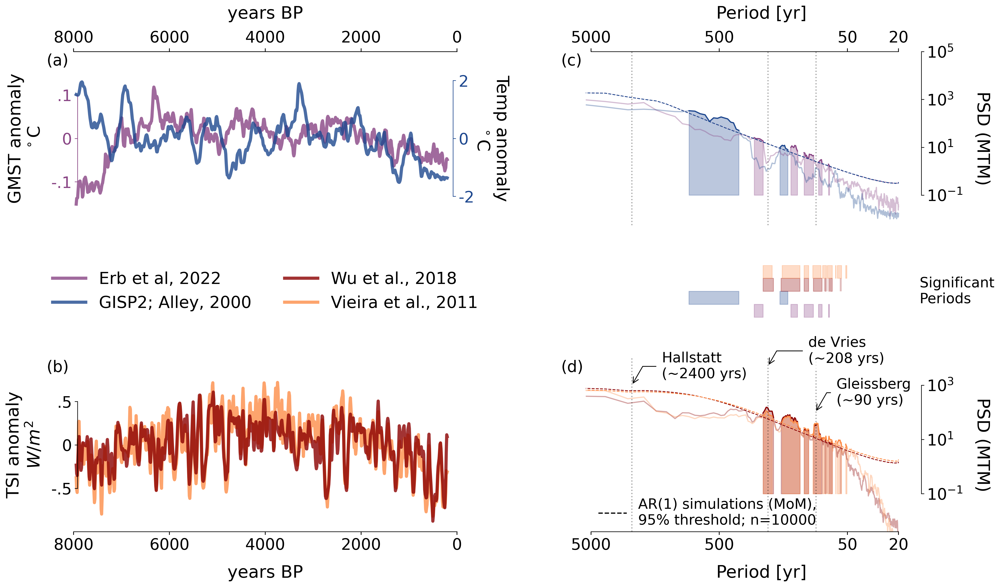

In [30]:
plt.rcParams["path.simplify_threshold"] = 0.2
prepared_compact = prepare_figure_layout(row_design_compact, row_groups_compact, series_versions, var_obj_d, compact_layout)

# Same function, different inputs:
compact_figure = make_figure(row_design_compact, row_groups_compact, compact_layout, n=n, palette=palette_compact, psd_results=compact_psd_results)

figures_dir = stem / "figures" / "Fig1__real_ts_psd_unified"
figures_dir.mkdir(exist_ok=True, parents=True)
# save_figure(compact_figure, figures_dir, stem="Fig1_real_ts_psd_unified", dry_run=True)


### Interpretation
Panels (a) and (b) show the four raw records side by side: the two temperature
reconstructions (ERB22, ALLEY00) share some multi-centennial structure but ALLEY00's
higher-latitude signal is visibly noisier and larger in amplitude, while the two TSI
reconstructions (WU18, VIEIRA11) track each other closely throughout. Panels (c) and
(d) show why similar periodicities alone aren't enough to establish causality: both
TSI reconstructions and ERB22 carry significant power near the Gleissberg band
(~90 yr), but ALLEY00 shows a distinct, only marginally significant band starting
near ~400 yr that neither ERB22 nor the TSI series share, a difference that
resurfaces later as the ~300 yr dip in CCM significance specific to the ALLEY00
dyads. This partial, inconsistent spectral overlap is the paper's motivation for
turning to CCM rather than relying on shared periodicities alone.

### Extended (Fig S5)

In [31]:
row_design_extended = [["raw_ts", "highpass_ts"], ["raw_ts", "lineardetrended_ts"], ["psd"]]

row_groups_extended = [
    [{"a": ["tian22ht115kaallgmst"]}, {"slot": "legend"}, {"b": ["erb22dagmst"]}],
    [{"c": ["alley00gisp2multiproxy"]}, {"d": ["doering22gisp2t15n"]}, {"slot": "legend"}, {"e": ["martin24gisp2tanom"]}, {"f": ["martin24ngriptanom"]}],
    [{"g": ["seierstad14gisp2d18o"]}, {"slot": "legend"}, {"h": ["seierstad14ngrip1d18o"]}],
    [{"i": ["wu18tsianom"]}, {"slot": "legend"}, {"j": ["vieira11tsianom"]}],
]

palette_extended = build_palette(var_obj_d, palette_var_groups=palette_var_groups, group_palette_triples=group_palette_triples)

extended_layout = {
    "figsize": (47, 63),
    "ts_width_ratio": 6,
    "psd_width_ratio": 5,
    "data_row_ratio": 5,
    "group_spacer_ratio": 0.8,
    "slot_ratios": (0.001, 1.5, 0.02),
    "hspace": 0.3,
    "wspace": 0.1,
    "base_right": 0.95,
    "labeled_secondary_right": 0.85,
    "time_limits": (-8000, 0),
    "plot_style": reference_plot_style,
    "linewidth": 4,
    "time_ticks": (-8000, -6000, -4000, -2000, 0),
    "include_source_labels": True,
    "legend_slot_ratios": (0.001, 0.3, 0.001),
    "show_section_dividers": True,
    "divider_frac": 0.8,
    "divider_color": "#d0d0d0",
    "divider_lw": 1.0,
    "divider_alpha": 0.7,
}

In [32]:
n=10000
extended_psd_results = calculate_psd_results(
    row_design_extended,
    row_groups_extended,
    series_versions,
    var_obj_d,
    n=n,
)

Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1306.02it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1339.05it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1333.34it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:08<00:00, 1196.01it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:08<00:00, 1212.15it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:08<00:00, 1180.78it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:08<00:00, 1227.01it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:08<00:00, 1214.76it/s]
Performing spectral analysis on individual series: 100%|██████████| 10000/10000 [00:07<00:00, 1353.49it/s]
Performing spectral analysis on indiv

In [33]:
prepared_extended = prepare_figure_layout(row_design_extended, row_groups_extended, series_versions, var_obj_d, extended_layout)

extended_figure = make_figure(
    row_design_extended, row_groups_extended, extended_layout,
    palette=palette_extended,
    palette_var_groups=palette_var_groups,
    group_palette_triples=group_palette_triples,
    psd_results=extended_psd_results,
)
figures_dir = stem / "figures" / "FigS5__real_ts_psd_extended"
figures_dir.mkdir(exist_ok=True, parents=True)
save_figure(extended_figure, figures_dir, stem="FigS5_real_ts_psd_extended", dry_run=True)

Would save local: /Users/jlanders/PycharmProjects/CCM_software/hol_temp_tsi_ccm_pb/figures/FigS5__real_ts_psd_extended/FigS5_real_ts_psd_extended_20260828_225726.pdf


{'local': PosixPath('/Users/jlanders/PycharmProjects/CCM_software/hol_temp_tsi_ccm_pb/figures/FigS5__real_ts_psd_extended/FigS5_real_ts_psd_extended_20260828_225726.pdf')}

### Interpretation
This is a reference figure rather than a finding. Each row is one record; color
is grouped by the quantity reported (GMST, local temperature anomaly, δ¹⁸O, or
TSI), and each panel within a row overlays the raw series against one treatment
(1-kyr high-pass or linearly detrended). Reading across a row shows which records
were most visibly affected by a given treatment versus barely changed, giving
context for the treated series that reappear later in the CCM sweep.